<a href="https://colab.research.google.com/github/Virginia-Romero-Messein/Mentorias-Monitoreo-de-Espacios-Verdes/blob/main/Analisis_y_Visualizacion_MEV_TP.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Setup
!pip install pandas_profiling==2.8.0
!pip install pandas==1.2.0

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
#!git clone https://github.com/felixlapalma/monitoreo-espacios-verdes-diplo202X.git
#!cat "monitoreo-espacios-verdes-diplo202X/data/ab-initio-dataset-build.md"

# Mentoria: Monitoreo de Espacios Verdes -- COLAB

__DIPLODATOS 2022 - FAMAF UNC__

_Felix Rojo Lapalma_

## Análisis y Visualización de Datos 

Trabajar con imágenes satelitales implica incorporar conceptos tales como rasters, resolución, bandas, proyecciones,etc. Para su visualización o representación existen diferentes formas que pueden brindar una mejor interpretación de las mismas (cuando queremos resaltar algo en particular por ejemplo). Adicionalmente al trabajo con rasters (en forma simplificada un raster es una grilla de puntos cada uno de los cuales tiene alguna clase de identificación geográfica, que nos permite ubicarlos en el espacio) le sumamos ciertas representaciones geométricas, lineas, puntos polígonos (también asociados a cierta clase de referencia geométrica) que nos permiten marcar sobre un raster ciertas zonas de interés por ejemplo.

Para una introduccion un poco mas extensa respecto al origen de los datos y su procesamiento se pueden referir a :
- [ab-initio-data-build](../data/ab-initio-dataset-build.md)
- [ab-initio-analisis-visualizacion](../data/ab-initio-analisis-visualizacion.md)


### Fuentes

El presente trabajo practico está fuertemente inspirado en los correspondientes de:

- _jbergamasco_
    - [jbergamasco2019](https://github.com/jbergamasco/DiploDatos2019)
    - [jbergamasco2020](https://github.com/jbergamasco/DiploDatos2020)
- [sergiobuzzi2020](https://github.com/sergiobuzzi/MentoriaDiploDatos2020)


In [ ]:
# running on colab
# from link @ https://github.com/felixlapalma/monitoreo-espacios-verdes-diplo202X/blob/main/data/ab-initio-dataset-build.md
!gdown https://drive.google.com/file/d/1tgbIQaEXzIghcFYyd2YM9iMho4TDHHFd/view?usp=sharing --fuzzy

Downloading...
From: https://drive.google.com/uc?id=1tgbIQaEXzIghcFYyd2YM9iMho4TDHHFd
To: /content/espacios-verdes-indexs-cba-20170101-20220420.zip
100% 170M/170M [00:12<00:00, 14.0MB/s]


In [ ]:
import pandas as pd
from pandas_profiling import ProfileReport

In [ ]:
# Notar el cambio del path y el tipo de archivo (no lo descomprimimos)
df_=pd.read_csv('/content/espacios-verdes-indexs-cba-20170101-20220420.zip',index_col=0)

Le damos una primera mirada al conjunto de datos.

In [ ]:
print(f"Dataframe HEAD")
display(df_.head())
print(f"Dataframe TAIL")
display(df_.tail())
print(f"Dataframe INFO")
display(df_.info())
print(f"Dataframe DESCRIBE")
display(df_.describe())

Dataframe HEAD


,B02_min,B02_max,B02_mean,B02_median,B02_nodata,B02_range,B02_count,B03_min,B03_max,B03_mean,...,sipi_median,sipi_nodata,sipi_range,sipi_count,raster,clouds_on_raster,osm_id,name,area_m2,date
0,0.0871,0.1421,0.102570,0.09650,0.0,0.0550,47,0.0768,0.1516,0.098885,...,0.884216,0.0,0.453065,47,S2A_MSIL1C_20170103T142022_N0204_R010_T20JLL_2...,0.0,605976736,NaN,4650.710032,2017-01-03
1,0.0970,0.1936,0.118354,0.10660,0.0,0.0966,13,0.1006,0.1949,0.122154,...,0.971875,0.0,0.247045,13,S2A_MSIL1C_20170103T142022_N0204_R010_T20JLL_2...,0.0,559322368,NaN,1502.000513,2017-01-03
2,0.0992,0.1273,0.111805,0.11290,0.0,0.0281,19,0.1037,0.1369,0.117795,...,0.973017,0.0,0.207006,19,S2A_MSIL1C_20170103T142022_N0204_R010_T20JLL_2...,0.0,559322369,NaN,2004.192528,2017-01-03
3,0.0995,0.1933,0.118491,0.11355,0.0,0.0938,66,0.0993,0.1990,0.124512,...,0.966202,0.0,0.258424,66,S2A_MSIL1C_20170103T142022_N0204_R010_T20JLL_2...,0.0,559328111,NaN,6940.507640,2017-01-03
4,0.1059,0.1385,0.122453,0.12240,0.0,0.0326,47,0.1036,0.1580,0.132455,...,0.993986,0.0,0.260419,47,S2A_MSIL1C_20170103T142022_N0204_R010_T20JLL_2...,0.0,559328112,NaN,4587.356048,2017-01-03


Dataframe TAIL


,B02_min,B02_max,B02_mean,B02_median,B02_nodata,B02_range,B02_count,B03_min,B03_max,B03_mean,...,sipi_median,sipi_nodata,sipi_range,sipi_count,raster,clouds_on_raster,osm_id,name,area_m2,date
208927,0.0990,0.1684,0.115990,0.11270,0.0,0.0694,31,0.0862,0.1627,0.107387,...,0.892669,0.0,0.545993,31,S2A_MSIL1C_20220417T141741_N0400_R010_T20JLL_2...,0.0,307532496,NaN,3824.467794,2022-04-17
208928,0.1145,0.3240,0.149746,0.13665,0.0,0.2095,80,0.0977,0.3363,0.149332,...,1.084102,0.0,2.805242,80,S2A_MSIL1C_20220417T141741_N0400_R010_T20JLL_2...,0.0,307535460,Plaza Exodo Jujeño,7184.535857,2022-04-17
208929,0.0993,0.1388,0.110870,0.10625,0.0,0.0395,10,0.0930,0.1473,0.106160,...,0.914887,0.0,0.199024,10,S2A_MSIL1C_20220417T141741_N0400_R010_T20JLL_2...,0.0,307796387,NaN,1147.997645,2022-04-17
208930,0.0991,0.1407,0.124008,0.12570,0.0,0.0416,53,0.0852,0.1377,0.118574,...,0.991200,0.0,0.299910,53,S2A_MSIL1C_20220417T141741_N0400_R010_T20JLL_2...,0.0,307097955,NaN,5185.690046,2022-04-17
208931,0.0874,0.1347,0.104697,0.10180,0.0,0.0473,95,0.0707,0.1321,0.095941,...,0.889747,0.0,0.456241,95,S2A_MSIL1C_20220417T141741_N0400_R010_T20JLL_2...,0.0,901791744,NaN,9394.381202,2022-04-17


Dataframe INFO
<class 'pandas.core.frame.DataFrame'>
Int64Index: 208932 entries, 0 to 208931
Columns: 167 entries, B02_min to date
dtypes: float64(140), int64(24), object(3)
memory usage: 267.8+ MB


None

Dataframe DESCRIBE


,B02_min,B02_max,B02_mean,B02_median,B02_nodata,B02_range,B02_count,B03_min,B03_max,B03_mean,...,sipi_min,sipi_max,sipi_mean,sipi_median,sipi_nodata,sipi_range,sipi_count,clouds_on_raster,osm_id,area_m2
count,167269.000000,167269.000000,167269.000000,167269.000000,208932.000000,167269.000000,208932.000000,167264.000000,167264.000000,167264.000000,...,1.672600e+05,1.672600e+05,1.672600e+05,167260.000000,208932.000000,1.672600e+05,208932.000000,208932.000000,2.089320e+05,2.089320e+05
mean,0.109851,0.166474,0.131182,0.129623,25.194393,0.056624,99.740877,0.099372,0.164881,0.125957,...,-1.688595e+35,1.708939e+35,NaN,0.969624,25.204545,3.397534e+35,99.730726,19.473638,4.343631e+08,1.249388e+04
std,0.030815,0.050951,0.034782,0.035332,341.298796,0.042698,699.326759,0.032069,0.051504,0.035032,...,7.578372e+36,7.623866e+36,NaN,0.253205,341.495289,1.125051e+37,699.314819,33.424013,2.141069e+08,7.895730e+04
min,0.000100,0.067000,0.062357,0.061900,0.000000,0.000000,0.000000,0.022000,0.048400,0.045698,...,-3.402823e+38,-9.347826e+00,-inf,-22.149998,0.000000,0.000000e+00,0.000000,0.000000,1.331006e+06,4.225951e+02
25%,0.093000,0.138700,0.112461,0.110300,0.000000,0.033900,11.000000,0.081000,0.136100,0.106518,...,7.514496e-01,1.040685e+00,9.009012e-01,0.891668,0.000000,2.119307e-01,11.000000,0.000000,2.867065e+08,2.066559e+03
50%,0.102700,0.154100,0.124327,0.122800,0.000000,0.046500,29.000000,0.092800,0.154000,0.119943,...,8.494449e-01,1.189367e+00,9.696900e-01,0.956522,0.000000,3.560274e-01,29.000000,0.000000,3.596742e+08,3.812182e+03
75%,0.116300,0.175900,0.138747,0.137800,0.000000,0.064300,56.000000,0.108400,0.178100,0.135888,...,9.036525e-01,1.456376e+00,1.072648e+00,1.054187,0.000000,6.366461e-01,56.000000,25.009939,6.059767e+08,6.644794e+03
max,0.631700,0.980300,0.684304,0.689700,13701.000000,0.891300,13701.000000,0.621800,1.064300,0.679233,...,1.887117e+00,3.402823e+38,inf,16.321413,13701.000000,6.805647e+38,13701.000000,100.000000,9.249657e+08,1.370630e+06


In [ ]:
df_.isnull().mean()*100

B02_min             19.940938
B02_max             19.940938
B02_mean            19.940938
B02_median          19.940938
B02_nodata           0.000000
                      ...    
clouds_on_raster     0.000000
osm_id               0.000000
name                74.768824
area_m2              0.000000
date                 0.000000
Length: 167, dtype: float64

In [ ]:
#df_['name'].unique()

In [ ]:
#df_.groupby(df_['name']=='Parque Sarmiento').area_m2.unique() 

La descripción de las columnas las pueden encontrar en:
- [estructura-datos](../data/estructura-datos.md)





## Sobre el Trabajo Requerido

Se propone la elaboración de un _informe o reporte_ que deberá entregarse en formato html/pdf/md y deberá apuntar a un público técnico, 
pero sin conocimientos específicos en el tema (es decir nos deberiamos abstraer de conceptos tales como raster, vectores, etc).  

La estructura del reporte sugerida es:

- Introducción [1]
- Presentación del Dataset (el que consideren mas vistoso o demostrativo) [2]
- Variables de interés (relacionado al punto [3])
- Series temporales (relacionado al punto [4])
- Conclusiones ([5])

Cada parte del informe las deberian poder extraer de las respuestas o comentarios de los proximos puntos.

__NOTA__: Todos aquellos listados como __Punto Extra__ no son necesarios para el informe pero su resolución se considera un aporte positivo.

### Presentación/Slides (__Punto Extra__)

Se valorará la generacion de una presentación compacta (< 8 slides) en base a lo analizado, que permita responder:
- Utilidad del Monitoreo de espacios verdes
- Beneficios/Desventajas
- Limitaciones del enfoque via indices de imagenes satelitales y mitigaciones a esto
- Condiciones o criterios que hagan que un dado espacio sea monitoreable via imágenes satelitales

__NOTA__: Por presentacion, entendemos, google slides, ppt, beamer,las generadas a partir de las jupyter notebooks,etc.

## [1] Introducción 

Sobre porque consideran importante el monitoreo de espacios verdes (y otras razones que quieran sumar). Y que piensan descubrir a
partir del análisis y la visualizacion de los mismos (o que piensan que no vamos a poder hacer)


**Una espacio verde, también conocido como zona verde o área verde, es un terreno delimitado en el que hay vegetación. Puede ser un bosque, una jungla, un parque o un jardín. Además, cuando hablamos de espacios verdes urbanos nos referimos a aquellos que se encuentran dentro de una ciudad o una aglomeración urbana. Conocer el estado de estos espacios es fundamental para establecer las bases y herramientas dirigidas a la solución de problemas territoriales, la gestión catastral, la prevención de riesgos naturales o el análisis de mercado.**




## [2] Presentación del Dataset

Sobre como entienden el dataset, como piensan que se generaron los valores dentro del dataset a partir de los datos crudos,etc.

## [3] Análisis Estadístico de Variables

Deberán realizar un análisis estadístico riguroso de variables que seleccionen por ser de su interés (entre 2 y 4), incluyendo en el set al menos una banda y un indice. 

Deberán responder preguntas como:

-   _Variables_: ¿Qué _tipo de variable_ es cada una? Parecen estar acotadas? (Puede ser interesante suplementar con alguna bibliografia extra respecto a que valores puede  tener un indice o banda) ¿Son fisicamente razonables?
-   _Outliers_: ¿Existen _outliers_ en las variables seleccionadas? (Note que en la presentación de los datos, esto parece estar presente en casi todos los casos)
-   _Valores Faltantes_: ¿Existen? ¿Es mejor descartarlos o completarlos con un valor particular? (Quizas le sirva responder la siguiente pregunta en primer lugar)
-   _Distribucion de Valores_: ¿Cómo es la _distribución_ de las variables en el dataset? ¿Se parecen a alguna distribucion que recuerde? Son todas de la misma distribución?
-   _Distribucion Condicionada_: ¿Cómo es la distribución de una variable (cualquiera que haya elegido) condicionada a la variable temporal por ejemplo? ¿Tiene sentido utilizar la dependencia temporal cuando estamos intentando completar valores faltantes?

En caso de calcular estadísticos, explicar por qué lo hicieron y que buscaban obtener al calcularlos. Utilizar los gráficos apropiados para mostrar el análisis realizado.  
Además:


-  ¿Existe _correlacion_ entre variables? ¿Entre cuales es mas "intensa"? -> Considere utilizar  [__pandas-profiling__](https://github.com/ydataai/pandas-profiling)
-  Analizar la dispersión de las bandas (para un estadistico, por ejemplo la media) a lo largo del tiempo. ¿La dispersión es la misma en todos los casos? ¿O existen bandas que "se dispersan" mas?

Utilizar gráficos que permitan visualizar de un modo simple las conclusiones.

## [4] Series temporales

Como las observaciones se encuentran indexadas en el tiempo, este tipo de datos se conocen como **series de tiempo**. Elija alguno de los espacios verdes mas conocidos (Parque Sarmiento por ejemplo) y responda: 

- ¿Cual es el período de tiempo bajo análisis?
- Elija una banda y un indice (B02 y NDVI, por ejemplo) ambos parecen seguir alguna estacionalidad? Es decir, sus valores parecen "repetirse" cada cierto periodo? (Para este analisis considere utilizar la mediana de todas las mediciones {}_median).
- Ahora extienda el analisis a todas las variables, son estacionales? Todas tienen el mismo tipo de estacionalidad? __Nota__: En este punto y etapa no se espera un criterio estricto de estacionalidad sino mostrar que bajo algun criterio (por ejemplo boxplots "similares" por temporada, etc) parecen serlo.
- Seleccione un índice y grafique un boxplot para cada año. ¿Se mantiene inalterada en el tiempo la distribución? Que pasa si ese boxplot lo separa por estación (invierno,verano,otoño, primavera) y año son parecidas entre ellas en algun caso? Como se comportan año a año?
- Tiene sentido calcular outliers para todo el tiempo de la serie o deberia segmentarse? Es decir, un outlier en otoño es lo mismo que en primavera o verano?
- Sobre datos faltantes, existe algun intervalo temporal en el cual esto parezca ser mas recurrente (observe [ab-initio-data-build](../data/ab-initio-dataset-build.md) # Imagenes CBA) ? 

    __Punto Extra__: replique la imágen _cantidad de imágenes por fecha y nubosidad_, se le ocurre alguna forma alternativa de representarlo?
- Sobre los outliers, elija alguna banda o indice y compute los outliers (bajo algun criterio que le parezca razonable), ahora contraste los mismos (o el rango de los mismos) con la representacion de los rasters ( descargables desde: [parches rbg/cloud-mask](https://drive.google.com/file/d/1VJnFvc9waDWPzm0i6UitKwlOSaQVwn_j/view?usp=sharing) ), su eleccion de outliers parece sostenerse? O esta desechando datos que podrian servir?
- __Punto Extra__: Explique el indice NDVI, y su aplicabilidad para observar la evolución de cultivos. ¿Esto nos serviria para monitorear plazas y parques?
- __Punto Extra__: Se le ocurre alguna forma de normalizar los datos para hacernos independientes de los años (pero si mantener la estacionalidad)? 
- __Punto Extra__: El tipo de sensor que estamos considerando esta afectado fuertemente por las condiciones luminicas, puede encontrar algún par de {imagenes, indices} que parezcan representar esta situación? Para ello deberia seleccionar imagenes cercanas temporalmente (misma semana o mes, sin nubes) y obtener sus indices. Podria concluir algo a partir de eso? O le hacen falta mas datos? (Respuesta preliminar: la informacion brindada parece ser insuficiente) 
- ¿Dado un indice, es capaz de encontrar algun rango temporal en el cual parezca romperse la estacionalidad? (Esto lo podria intentar contrastar con las imagenes en rgb para ello le recomendamos que elija un espacio verde extenso)
- Le parece que existen espacios verdes que no sean susceptibles de ser monitoreados via las bandas o indices? 

    __Punto Extra__: Podria generar condiciones o criterios (tamaño, reflectancia en alguna banda, etc) que nos indiquen si un dado espacio es monitoreable ( o no) via imágenes satelitales?


## [5] Conclusiones

Se considerará como positivo la capacidad de generar conclusiones o analisis que permitan construir nuevo conocimiento en base a los datos provistos.
Respecto a las conclusiones, se espera que a partir de los puntos [3] y [4] hayan podido conocer el dataset y tener una idea (linea de acción) para mitigar o atacar temas tales como:
- Outliers?
- Faltantes de datos?
- Todas las variables son relevantes?
- etc

No hay límites respecto a la extensión, pero se valorará el poder de síntesis y de comunicación, así como el uso de las herramientas pertinentes..


Enlaces agregados por mi (Gise)

http://rstudio-pubs-static.s3.amazonaws.com/379692_27f73ba741f943338933f60d827dbed3.html

https://bookdown.org/content/2274/series-temporales.html

https://desktop.arcgis.com/es/arcmap/10.3/manage-data/raster-and-images/cell-size-of-raster-data.htm
https://plantae.garden/imagenes-satelitales-e-indices-ndvi-y-ndwi/

## Pandas Profiling

In [ ]:
BANDS = ["B02", "B03", "B04", "B05", "B06", "B07", "B8A", "B08", "B11", "B12"]
TEST_COLS=[f"{B}_median" for B in BANDS]

In [ ]:
df_.loc[:,TEST_COLS]
df_test=df_.loc[:,TEST_COLS]
df_test.head()

,B02_median,B03_median,B04_median,B05_median,B06_median,B07_median,B8A_median,B08_median,B11_median,B12_median
0,0.09650,0.09340,0.0779,0.1157,0.1991,0.2459,0.2278,0.2645,0.18770,0.1231
1,0.10660,0.11010,0.0988,0.1482,0.2596,0.3080,0.3012,0.3329,0.25420,0.1730
2,0.11290,0.11870,0.1062,0.1405,0.2555,0.3116,0.3011,0.3415,0.24640,0.1543
3,0.11355,0.11865,0.1037,0.1512,0.2930,0.3647,0.3393,0.3928,0.26675,0.1585
4,0.12240,0.13190,0.1219,0.1722,0.2946,0.3450,0.3276,0.3773,0.28950,0.1854


In [ ]:
profile = ProfileReport(df_test)

In [ ]:
profile.to_file('/content/pandas-profiling-test.html')

Summarize dataset:   0%|          | 0/24 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
profile.to_notebook_iframe()

**Resolución inciso 3**

El conjunto de datos pre-procesados tienen un formato tabular. Los mismos se corresponden con diferentes estadísticos o propiedades extraídas desde el conjunto de rasters (parches):

{B0i/indice}_{min,max,mean,median,nodata,range,count}:
min: valor mínimo alcanzado por la Banda o indice en la zona de interés.

max: valor máximo alcanzado por la Banda o indice en la zona de interés.

median: mediana alcanzada por la Banda o indice en la zona de interés.

nodata: cantidad de valores nulos en la Banda o indice en la zona de interés.

range: rango de los valores alcanzado por la Banda o indice en la zona de interés.

count: cantidad de valores en la zona de interés (count + nodata son la cantidad total de pixeles de un dado espacio verde)

raster: raster del cual se extraen los estadísticos

clouds_on_raster: nubosidad del raster completo

osm_id: identificador asociado a la capa original (atlas-espacios-verdes)

name: nombre del espacio ( si es que lo tiene, por ejemplo, Parque Sarmiento).

area_m2: area en metros cuadrados

date: fecha de la muestra.


**NOTA**: Zona de Interés == espacio verde

Es decir para cada espacio verde comprendido en la ciudad de cordoba (y para cada fecha disponible) se computa las magnitudes mencionadas.

In [ ]:
df_.shape

(208932, 167)

In [ ]:
df_.columns.values #nombre de las columnas (167 en total)

array(['B02_min', 'B02_max', 'B02_mean', 'B02_median', 'B02_nodata',
       'B02_range', 'B02_count', 'B03_min', 'B03_max', 'B03_mean',
       'B03_median', 'B03_nodata', 'B03_range', 'B03_count', 'B04_min',
       'B04_max', 'B04_mean', 'B04_median', 'B04_nodata', 'B04_range',
       'B04_count', 'B05_min', 'B05_max', 'B05_mean', 'B05_median',
       'B05_nodata', 'B05_range', 'B05_count', 'B06_min', 'B06_max',
       'B06_mean', 'B06_median', 'B06_nodata', 'B06_range', 'B06_count',
       'B07_min', 'B07_max', 'B07_mean', 'B07_median', 'B07_nodata',
       'B07_range', 'B07_count', 'B8A_min', 'B8A_max', 'B8A_mean',
       'B8A_median', 'B8A_nodata', 'B8A_range', 'B8A_count', 'B08_min',
       'B08_max', 'B08_mean', 'B08_median', 'B08_nodata', 'B08_range',
       'B08_count', 'B11_min', 'B11_max', 'B11_mean', 'B11_median',
       'B11_nodata', 'B11_range', 'B11_count', 'B12_min', 'B12_max',
       'B12_mean', 'B12_median', 'B12_nodata', 'B12_range', 'B12_count',
       'ndvi_min', 'nd

In [ ]:
#columnas de interés
interesting_columns=['ndvi_mean','ndwi_mean','B02_mean','B08_mean' ] 

* NDVI: Índice de Vegetación Diferencial Normalizado (Normalized Difference Vegetation Index)

$$\text { NDVI }(\text { Sentinel } 2)=(B08-B04) /(B08+B04)$$

Es un indicador que señala el verdor, densidad y salud de la vegetación en cada píxel de una imagen de satélite. Es adimensional y toma valores entre $-1$ y $1$.

* NDWI: Índice Diferencial de Agua Normalizado (Normalized Difference Water Index)

$$
\text { NDWI }(\text { Sentinel } 2)=(B03-B08) /(B03+B08)
$$

Nos proporciona información sobre la hidratación de la vegetación ya que mide el contenido de humedad en la zona de interés. Es adimensional y toma valores entre $-1$ y $1$.


* B02: segmento (banda) del espectro electromagnético correspondiente al color azul.

* B08: banda correspondiente a la región NIR (infrarroja cercana) del espectro electromagnético.

**Nota**: los valores de banda expresados en este dataset se encuentran en unidades de reflectancia.

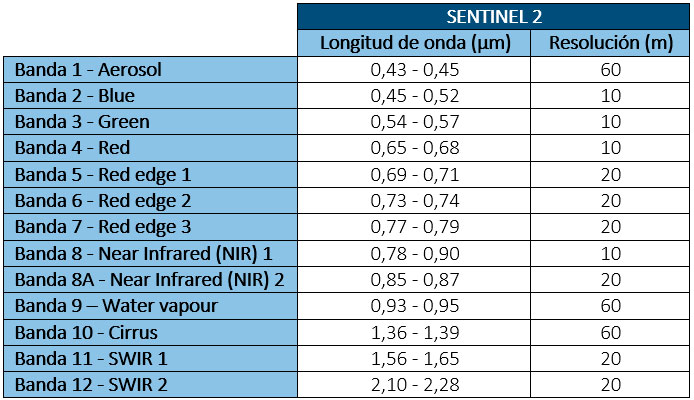


In [ ]:
#Tipo de variables
numerical = [var for var in df_[interesting_columns].columns if df_[interesting_columns][var].dtype== float]
numerical

['ndvi_mean', 'ndwi_mean', 'B02_mean', 'B08_mean']

Como se puede observar, todas las variables elegidas son numéricas. Veamos si están acotadas.

In [ ]:
df_interes=df_[interesting_columns]
df_interes.describe()

,ndvi_mean,ndwi_mean,B02_mean,B08_mean
count,167260.000000,167260.000000,167269.000000,167263.000000
mean,0.371137,-0.366632,0.131182,0.271391
std,0.125899,0.092958,0.034782,0.055003
min,-0.221707,-0.651728,0.062357,0.024750
25%,0.271339,-0.436023,0.112461,0.236938
50%,0.367881,-0.368832,0.124327,0.271855
75%,0.469717,-0.308050,0.138747,0.305100
max,0.760741,0.263821,0.684304,0.866859


Todas las variables están acotadas por un máximo y un mínimo . 

La media de cada índice se encuentra entre $-1$ y $1$ y el $\%$ de reflectancia de las bandas en estudio toma valores en $[0,1]$.


**Valores faltantes**

In [ ]:
df_interes.isnull().mean()*100

ndvi_mean    19.945245
ndwi_mean    19.945245
B02_mean     19.940938
B08_mean     19.943809
dtype: float64

Las 4 variables elegidas tienen aproximadamente un 20% de valores faltantes.

**Distribuciones y Outliers**

Por medio de gráficos como los histogramas y boxplots asociados a las variables podemos visualizar e intuir la posible distribución de ellas. Por otro lado el gráfico boxplot nos ayudará a tomar dimensión sobre la cantidad de outliers que se presentan y cómo afectan a la distribución de las variables.

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

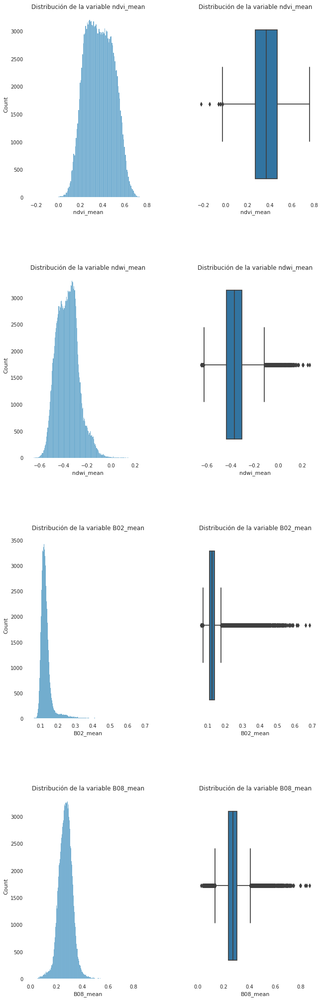

In [ ]:
fig, axes = plt.subplots(nrows=len(interesting_columns), ncols=2, figsize=(10,30)) #ancho=10, alto=30

for index, col in enumerate(interesting_columns):
  axes[index][0].set_title(f"Distribución de la variable {col}")
  sns.histplot(x=df_interes[col], ax=axes[index][0])
  axes[index][1].set_title(f"Distribución de la variable {col}")
  sns.boxplot(x=df_interes[col], ax=axes[index][1])

plt.subplots_adjust(left=0.1,
                    bottom=0.1, 
                    right=0.9, 
                    top=1, 
                    wspace=0.4, 
                    hspace=0.4)
plt.show()

La visualización por medio de boxplot nos confirma la presencia de valores extremos para todas las variables en estudio.

Estos outliers afectan a la distribución de cada variable así, por medio de ambos gráficos, podemos asociarles distribuciones conocidas como la Normal o la Chi Cuadrado. 

Por ejemplo, el insesgamiento hacia la derecha de B02_mean hace posible asociarle (entre muchas otras posibilidades) una distribución Chi Cuadrado (caso especial de una distribución Gamma). Mientras que a las medias de los índices se le puede asociar una distribución Normal. Recordemos que estas suposiciones son sólo a nivel intuitivo y es necesario realizar distintas aproximaciones y test para corroborar cual es la distribución que mejor se ajusta a nuestros datos (por ejemplo, la prueba Chi Cuadrado de bondad de ajuste).





**Distribución condicionada**

Estudiaremos cómo varía la media del NDVI condicionada al tiempo.

In [ ]:
df_['date'] = pd.to_datetime(df_.date, format='%Y/%m/%d')

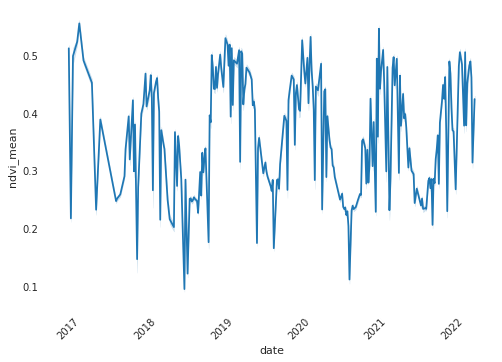

In [ ]:
sns.lineplot(data=df_, x='date', y='ndvi_mean')
plt.xticks(rotation=45);

No es posible asociarle una distribución de "ndvi_mean" condicionada a la variable temporal "date". El gráfico nos muestra una trayectoria a lo largo del tiempo del ndvi_mean la cual se comporta como una función pero no tiene las características de una función de probabilidad. Por este motivo, imputar los valores faltantes de ndvi_mean condicionándolo a una variable temporal no sería apropiado en una primera instancia; a no ser que consideremos imputarlos estudiando el comportamiento de este índice por periodos de tiempo más pequeños, por ejemplo, por estaciones (verano, otoño, invierno y primavera).

En el gráfico anterior podemos observar que el indice de vegetacion diferencial normalizado medio fluctua alrededor de un valor medio constante y presenta una variabilidad aproximadamente constante alrededor de dicho valor medio. Por este motivo decidimos calcular la media y la varianza muestral por año para indagar sobre este comportamiento.

La siguiente tabla muestra los valores de la media y la desviación estándar del ndvi_mean por año:

In [ ]:
import numpy as np
df_[['date','ndvi_mean']].groupby(df_['date'].dt.year).agg({'ndvi_mean':[np.mean, np.std]}).sort_values('date')

ndvi_mean          
          mean       std
date                    
2017  0.379116  0.126296
2018  0.357918  0.120226
2019  0.396772  0.126181
2020  0.346232  0.125398
2021  0.367674  0.124134
2022  0.419880  0.121259

Los resultados de la tabla anterior nos muestran que efectivamente se puede pensar que los valores de ndvi_mean oscilan alrededor de un valor medio y que la desviación estándar se mantiene aproximadamente constante a lo largo de los 6 años de estudio. Si calculamos la media y el desvío de los valores de ndvi_mean por año podemos obtener el valor medio aproximado alrededor del cual se producen esas fluctuaciones.



In [ ]:
#calculamos la media de los valores arrojados por la tabla anterior
df_[['date','ndvi_mean']].groupby(df_['date'].dt.year).agg({'ndvi_mean':[np.mean, np.std]}).sum()/6

ndvi_mean  mean    0.377932
           std     0.123916
dtype: float64

Esto nos dice que los valores medios de ndvi_mean oscilan en promedio alrededor de 0.38 con una desviación estándar promedio de 0.12.

**Profile**: correlación entre las variables en estudio

In [ ]:
profile = ProfileReport(df_interes)

/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:4446: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


In [ ]:
df_interes.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 208932 entries, 0 to 208931
Data columns (total 4 columns):
 #   Column     Non-Null Count   Dtype  
---  ------     --------------   -----  
 0   ndvi_mean  167260 non-null  float64
 1   ndwi_mean  167260 non-null  float64
 2   B02_mean   167269 non-null  float64
 3   B08_mean   167263 non-null  float64
dtypes: float64(4)
memory usage: 16.0 MB


In [ ]:
profile.to_file('/content/pandas-profiling-test.html')

Summarize dataset:   0%|          | 0/18 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/pandas/core/series.py:4439: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  downcast=downcast,
/usr/local/lib/python3.7/dist-packages/pandas/core/series.py:4439: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  downcast=downcast,


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
profile.to_notebook_iframe()

Analizando el grafico de interacciones entre las variables de a pares podemos observar que existe una correlación lineal altamente negativa entre ndvi_mean y ndwi_mean, y una correlación lineal  positiva entre la banda 2 y ndwi_mean. Por otro lado, la banda 8 no presenta correlación con el resto de las variables. 

Lo anterior se puede corroborar el el heatmap que nos muestra la matriz de correlación entre las variables usando el coeficiente de correlación de Pearson (también se muestran heatmaps con otras medidas de correlación).

**Dispersión de la media de las bandas B02 y B08 a lo largo del tiempo** 

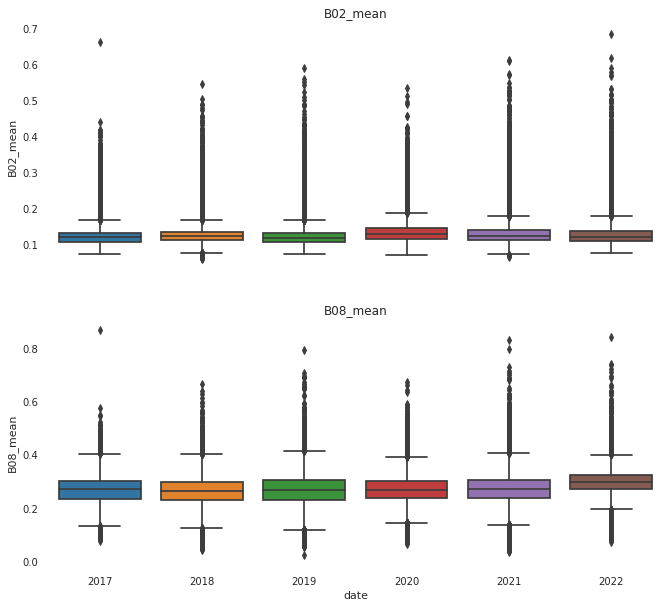

In [ ]:
fig, ejes = plt.subplots(2, 1, figsize=(11, 10), sharex=True)
for nombre, eje in zip(['B02_mean','B08_mean'], ejes):
    sns.boxplot(data=df_, x=df_['date'].dt.year, y=nombre, ax=eje)
    eje.set_title(nombre)
    if eje != ejes[-1]:
        eje.set_xlabel('')

En los gráficos boxplot se puede observar que el ancho de las cajas para la media de cada banda se mantienen aproximadamente constante a lo largo del tiempo, lo que nos da la pauta de que la dispersión de cada una de ellas no cambia significativamente con el tiempo. Sin embargo, se puede apreciar bajo el mismo criterio anterior, que el ancho de las cajas para la variable B08_mean es mayor al ancho de las cajas de B02_mean.

Lo anterior quiere decir que la variación de la media de las bandas difieren unas de otras en el orden especificado:

$$\sigma_{B02\_mean} < \sigma_{B08\_mean}$$



## [4] Series temporales

Como las observaciones se encuentran indexadas en el tiempo, este tipo de datos se conocen como **series de tiempo**. Elija alguno de los espacios verdes mas conocidos (Parque Sarmiento por ejemplo) y responda: 

- ¿Cual es el período de tiempo bajo análisis?
- Elija una banda y un indice (B02 y NDVI, por ejemplo) ambos parecen seguir alguna estacionalidad? Es decir, sus valores parecen "repetirse" cada cierto periodo? (Para este analisis considere utilizar la mediana de todas las mediciones {}_median).
- Ahora extienda el analisis a todas las variables, son estacionales? Todas tienen el mismo tipo de estacionalidad? __Nota__: En este punto y etapa no se espera un criterio estricto de estacionalidad sino mostrar que bajo algun criterio (por ejemplo boxplots "similares" por temporada, etc) parecen serlo.
- Seleccione un índice y grafique un boxplot para cada año. ¿Se mantiene inalterada en el tiempo la distribución? Que pasa si ese boxplot lo separa por estación (invierno,verano,otoño, primavera) y año son parecidas entre ellas en algun caso? Como se comportan año a año?
- Tiene sentido calcular outliers para todo el tiempo de la serie o deberia segmentarse? Es decir, un outlier en otoño es lo mismo que en primavera o verano?
- Sobre datos faltantes, existe algun intervalo temporal en el cual esto parezca ser mas recurrente (observe [ab-initio-data-build](../data/ab-initio-dataset-build.md) # Imagenes CBA) ? 

    __Punto Extra__: replique la imágen _cantidad de imágenes por fecha y nubosidad_, se le ocurre alguna forma alternativa de representarlo?
- Sobre los outliers, elija alguna banda o indice y compute los outliers (bajo algun criterio que le parezca razonable), ahora contraste los mismos (o el rango de los mismos) con la representacion de los rasters ( descargables desde: [parches rbg/cloud-mask](https://drive.google.com/file/d/1VJnFvc9waDWPzm0i6UitKwlOSaQVwn_j/view?usp=sharing) ), su eleccion de outliers parece sostenerse? O esta desechando datos que podrian servir?
- __Punto Extra__: Explique el indice NDVI, y su aplicabilidad para observar la evolución de cultivos. ¿Esto nos serviria para monitorear plazas y parques?
- __Punto Extra__: Se le ocurre alguna forma de normalizar los datos para hacernos independientes de los años (pero si mantener la estacionalidad)? 
- __Punto Extra__: El tipo de sensor que estamos considerando esta afectado fuertemente por las condiciones luminicas, puede encontrar algún par de {imagenes, indices} que parezcan representar esta situación? Para ello deberia seleccionar imagenes cercanas temporalmente (misma semana o mes, sin nubes) y obtener sus indices. Podria concluir algo a partir de eso? O le hacen falta mas datos? (Respuesta preliminar: la informacion brindada parece ser insuficiente) 
- ¿Dado un indice, es capaz de encontrar algun rango temporal en el cual parezca romperse la estacionalidad? (Esto lo podria intentar contrastar con las imagenes en rgb para ello le recomendamos que elija un espacio verde extenso)
- Le parece que existen espacios verdes que no sean susceptibles de ser monitoreados via las bandas o indices? 

    __Punto Extra__: Podria generar condiciones o criterios (tamaño, reflectancia en alguna banda, etc) que nos indiquen si un dado espacio es monitoreable ( o no) via imágenes satelitales?


In [ ]:
zona_interes= 'Parque Sarmiento'

df_sarmiento=df_[df_.name == zona_interes]

df_sarmiento.shape[0] #numero de registros en la zona de interés

276

In [ ]:
df_sarmiento.isnull().mean()*100

B02_min             15.217391
B02_max             15.217391
B02_mean            15.217391
B02_median          15.217391
B02_nodata           0.000000
                      ...    
clouds_on_raster     0.000000
osm_id               0.000000
name                 0.000000
area_m2              0.000000
date                 0.000000
Length: 167, dtype: float64

In [ ]:
df_sarmiento.describe()

,B02_min,B02_max,B02_mean,B02_median,B02_nodata,B02_range,B02_count,B03_min,B03_max,B03_mean,...,sipi_min,sipi_max,sipi_mean,sipi_median,sipi_nodata,sipi_range,sipi_count,clouds_on_raster,osm_id,area_m2
count,234.000000,234.000000,234.000000,234.000000,276.000000,234.000000,276.000000,234.000000,234.000000,234.000000,...,2.340000e+02,2.340000e+02,2.340000e+02,234.000000,276.000000,2.340000e+02,276.000000,276.000000,276.0,2.760000e+02
mean,0.088160,0.390703,0.127763,0.122369,1711.152174,0.302543,6876.847826,0.065391,0.390225,0.119132,...,-1.745038e+37,2.472137e+37,-inf,0.893181,1717.905797,4.217174e+37,6870.094203,19.473638,6170329.0,8.596086e+05
std,0.024403,0.094383,0.034627,0.033647,3301.249362,0.102731,3301.249362,0.025619,0.096853,0.033555,...,7.521780e+37,8.851316e+37,NaN,0.112431,3313.196912,1.167036e+38,3313.196912,33.484649,0.0,3.032297e-09
min,0.066100,0.162800,0.091781,0.085600,0.000000,0.048800,0.000000,0.044000,0.139800,0.071913,...,-3.402823e+38,8.208233e-01,-inf,0.214015,0.000000,2.754872e-01,0.000000,0.000000,6170329.0,8.596086e+05
25%,0.075250,0.352450,0.109873,0.104850,0.000000,0.264300,8588.000000,0.052425,0.353525,0.101845,...,-1.028868e+02,1.436892e+01,8.465061e-01,0.839602,0.000000,3.486880e+01,8588.000000,0.000000,6170329.0,8.596086e+05
50%,0.080200,0.374100,0.117904,0.113900,0.000000,0.294250,8588.000000,0.057550,0.376800,0.110390,...,-3.162740e+01,3.004971e+01,9.207324e-01,0.903240,0.000000,9.411054e+01,8588.000000,0.000000,6170329.0,8.596086e+05
75%,0.091425,0.405150,0.127811,0.122875,0.000000,0.324825,8588.000000,0.065475,0.410725,0.118639,...,-1.094304e+01,8.981506e+01,1.000388e+00,0.959395,0.000000,2.415759e+02,8588.000000,25.009939,6170329.0,8.596086e+05
max,0.248400,0.866100,0.296734,0.293900,8588.000000,0.795900,8588.000000,0.234700,0.876400,0.282713,...,7.079510e-01,3.402823e+38,3.978980e+34,1.135817,8588.000000,6.805647e+38,8588.000000,100.000000,6170329.0,8.596086e+05


In [ ]:
#periodo de analisis
df_sarmiento[['date']].min(), df_sarmiento[['date']].max()

(date   2017-01-03
 dtype: datetime64[ns], date   2022-04-17
 dtype: datetime64[ns])

Estamos analizando los datos en el siguiente rango de fechas: $[03\_01\_2017; 17\_04\_2022]$

Ahora estudiamos el posible comportamiento estacional de las variables ndvi_median y B02_median:

[]

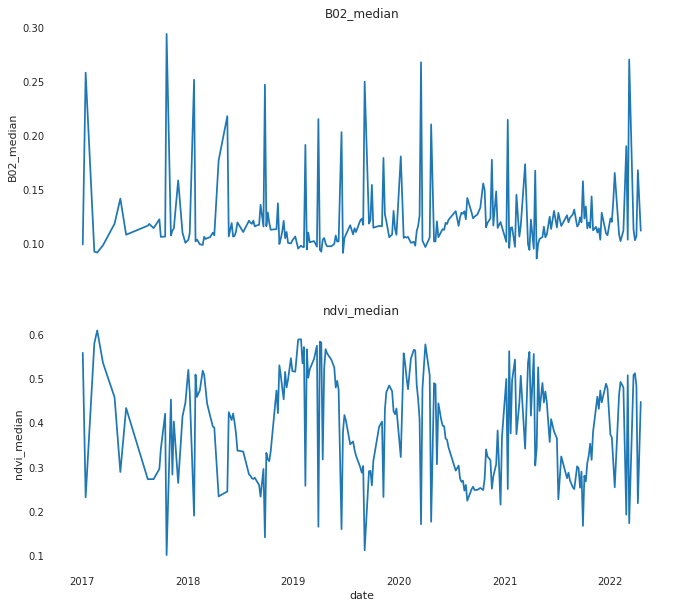

In [ ]:
fig, ejes = plt.subplots(2, 1, figsize=(11, 10), sharex=True)
for nombre, eje in zip(['B02_median','ndvi_median'], ejes):
    sns.lineplot(data=df_sarmiento, x=df_sarmiento['date'], y=nombre, ax=eje)
    eje.set_title(nombre)
    if eje != ejes[-1]:
        eje.set_xlabel('')
plt.plot()

Tanto para la variable ndvi_median como para B02_mean, los valores (o el comportamiento de esos valores) parecen repetirse anualmente.

Para extender el análisis al resto de las variables primero analizaremos el coeficiente de correlación de a pares para establecer un criterio de elección. 

Como un primer criterio nos quedaremos con aquellas variables que representen la mediana de las bandas e índices y luego estudiaremos los valores de correlación de Pearson eligiendo solo una variable del par con correlación mayor a 0.85 (en valor absoluto). 

Las variables que no presenten correlación con ninguna otra serán incluidas dentro del conjunto de interés.

In [ ]:
#Primero analizamos correlación por bandas
BANDS = [ "B02", "B03","B04", "B05","B06", "B07", "B8A", "B08","B11", "B12"]
TEST_COLS=[f"{B}_median" for B in BANDS]

In [ ]:
df_.loc[:,TEST_COLS]
df_bandas=df_.loc[:,TEST_COLS]
df_bandas.head()

,B02_median,B03_median,B04_median,B05_median,B06_median,B07_median,B8A_median,B08_median,B11_median,B12_median
0,0.09650,0.09340,0.0779,0.1157,0.1991,0.2459,0.2278,0.2645,0.18770,0.1231
1,0.10660,0.11010,0.0988,0.1482,0.2596,0.3080,0.3012,0.3329,0.25420,0.1730
2,0.11290,0.11870,0.1062,0.1405,0.2555,0.3116,0.3011,0.3415,0.24640,0.1543
3,0.11355,0.11865,0.1037,0.1512,0.2930,0.3647,0.3393,0.3928,0.26675,0.1585
4,0.12240,0.13190,0.1219,0.1722,0.2946,0.3450,0.3276,0.3773,0.28950,0.1854


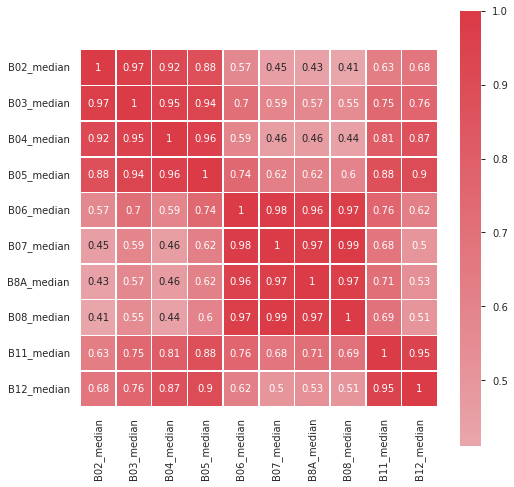

In [ ]:
# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(8,8))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(240, 10, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(df_bandas.corr(), cmap=cmap, center=0,
             square=True, linewidths=.5, annot=True)

Observando los resultados del heatmap podemos identificar tres grupos diferentes según su grado de asociación lineal altamente positivo:

* Para el primer grupo vemos que B04_median es buena representante de B02_median, B03_media y B05_median.

* En el segundo grupo elegimos a B08_median como representante de B06_median, B07_median y B8A_median.

* El tercer grupo está formado por las variables B11_median y B12_median, por lo que podemos escoger cualquiera de las dos.




A continuación estudiamos la correlación ente la mediana de los indices que se encuentran en nuestro dataset.

In [ ]:

INDICES=["ndvi", "ndwi", "pvr", "ndii", "mNDVI", "VARIGreen", "epichlb", "gari", "osavi", "tcari", "tcariOsavi", "sipi"]
TEST_COLS_I=[f"{B}_median" for B in INDICES]

In [ ]:
df_.loc[:,TEST_COLS_I]
df_indices=df_.loc[:,TEST_COLS_I]
df_indices.head()



,ndvi_median,ndwi_median,pvr_median,ndii_median,mNDVI_median,VARIGreen_median,epichlb_median,gari_median,osavi_median,tcari_median,tcariOsavi_median,sipi_median
0,0.547001,-0.478066,0.091723,0.166902,1.301351,0.217165,0.002623,1.285897,0.435000,0.093993,0.212710,0.884216
1,0.534292,-0.509740,0.053555,0.145259,1.059602,0.103757,0.003028,1.061493,0.453745,0.103725,0.240232,0.971875
2,0.525454,-0.492334,0.057461,0.158971,1.057045,0.117060,0.002984,1.058720,0.448569,0.092038,0.203292,0.973017
3,0.593190,-0.531563,0.064283,0.195676,1.072501,0.121635,0.002909,1.073903,0.515213,0.112404,0.211842,0.966202
4,0.508717,-0.476817,0.043163,0.129762,1.012175,0.083725,0.003148,1.012648,0.447423,0.123183,0.264819,0.993986


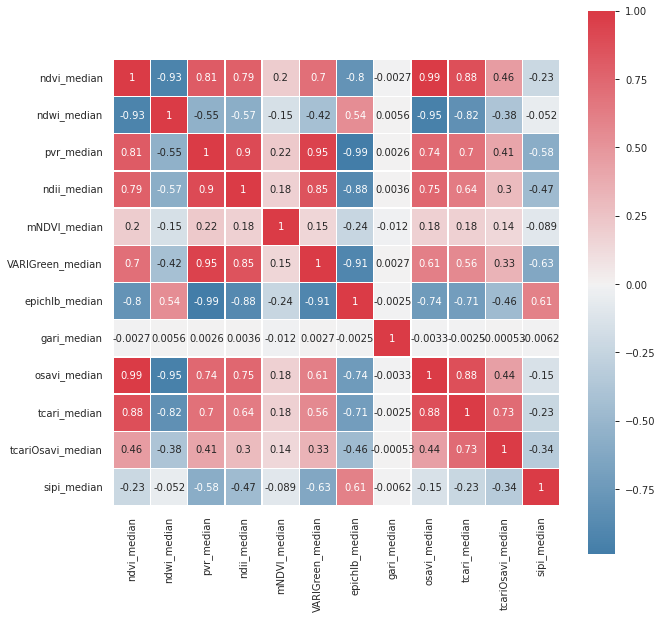

In [ ]:
# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(10,10))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(240, 10, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(df_indices.corr(), cmap=cmap, center=0,
            square=True, linewidths=.5, annot=True)

A partir de los resultados de correlación entre los índices, podemos optar quedarnos con la mediana de los siguientes índices:

* ndvi
* mNDVI
* gari
* sipi
* tcariOsavi
* ndii

Veamos si existe correlación entre las bandas seleccionadas anteriormente y estos índices.

In [ ]:
INDICES_BANDAS=["ndvi", "mNDVI", "gari","tcariOsavi", "sipi", "ndii", "B04", "B08", "B11"]
TEST_COLS_I_B=[f"{B}_median" for B in INDICES_BANDAS]

In [ ]:
df_.loc[:,TEST_COLS_I]
df_CORR=df_.loc[:,TEST_COLS_I_B]
df_CORR.head()

,ndvi_median,mNDVI_median,gari_median,tcariOsavi_median,sipi_median,ndii_median,B04_median,B08_median,B11_median
0,0.547001,1.301351,1.285897,0.212710,0.884216,0.166902,0.0779,0.2645,0.18770
1,0.534292,1.059602,1.061493,0.240232,0.971875,0.145259,0.0988,0.3329,0.25420
2,0.525454,1.057045,1.058720,0.203292,0.973017,0.158971,0.1062,0.3415,0.24640
3,0.593190,1.072501,1.073903,0.211842,0.966202,0.195676,0.1037,0.3928,0.26675
4,0.508717,1.012175,1.012648,0.264819,0.993986,0.129762,0.1219,0.3773,0.28950


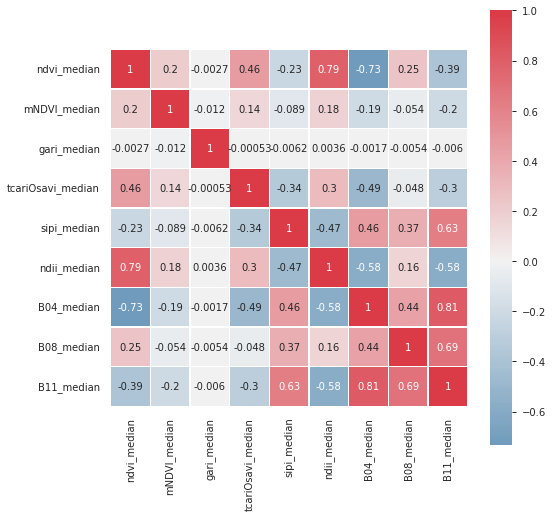

In [ ]:
# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(8,8))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(240, 10, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(df_CORR.corr(), cmap=cmap, center=0,
            square=True, linewidths=.5, annot=True)

Según el criterio establecido, ninguna valor de correlación muestral supera el 0.85 en valor absoluto, luego el conjunto de variables que elegimos es el especificado en la lista INDICES_BANDAS.

**Estudio del comportamiento estacional**

Una serie de tiempo es estacional cuando podemos observar en ella un patrón sistemático que se repite periódicamente (cada año, cada mes, etc., dependiendo de las unidades de tiempo en que vengan recogidos los datos). 

Si una serie tiene un comportamiento estacional muy claro se suele detectar
fácilmente en el gráfico de línea (lineplot).  Sin embargo, para estudiar el comportamiento estacional de una serie es más adecuado representar el diagrama de boxplot de cada una de las unidades de tiempo que componen los periodos en los que se agrupan los patrones de repetición. 



In [ ]:
df_sarmiento_copy=df_sarmiento.copy()
df_sarmiento_copy['date'] = pd.to_datetime(df_sarmiento_copy.date, format='%Y/%m/%d')


In [ ]:
#le asignamos a cada fecha la estación del año correspondiente.
from datetime import date, datetime

def season_of_date(date):
    year = str(date.year)
    seasons = {'Otoño': pd.date_range(start='21/03/'+year, end='20/06/'+year),
               'Invierno': pd.date_range(start='21/06/'+year, end='22/09/'+year),
               'Primavera': pd.date_range(start='23/09/'+year, end='20/12/'+year)}
    if date in seasons['Primavera']:
        return 'Primavera'
    if date in seasons['Invierno']:
        return 'Invierno'
    if date in seasons['Otoño']:
        return 'Otoño'
    else:
        return 'Verano'

# Assuming df has a date column of type `datetime`
df_sarmiento_copy['estacion'] = df_sarmiento_copy.date.map(season_of_date)


In [ ]:
df_sarmiento_copy.estacion.describe(include='O')

count        276
unique         4
top       Verano
freq          82
Name: estacion, dtype: object

**Boxplot por año y estación para cada variable correspondiente a los índices**

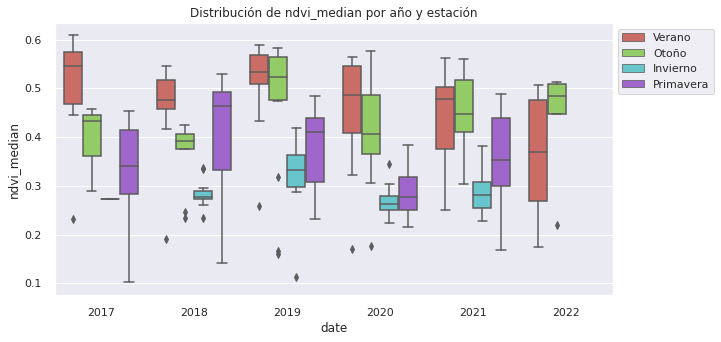

In [ ]:
#https://unipython.com/analisis-de-series-temporales-con-la-libreria-pandas/
sns.set(rc={'figure.figsize':(10, 5)})
sns.boxplot(data=df_sarmiento_copy, x=df_sarmiento_copy['date'].dt.year, hue='estacion', y='ndvi_median', palette="hls")
plt.title('Distribución de ndvi_median por año y estación')
plt.legend(bbox_to_anchor=(1, 1), loc='upper left') 
plt.show()


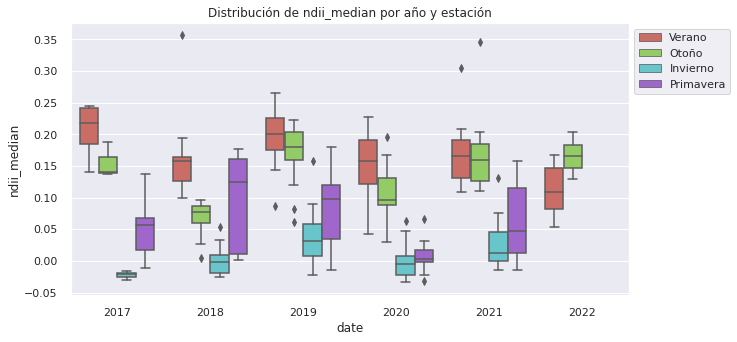

In [ ]:
sns.boxplot(data=df_sarmiento_copy, x=df_sarmiento_copy['date'].dt.year, hue='estacion', y='ndii_median', palette="hls")
plt.title('Distribución de ndii_median por año y estación')
plt.legend(bbox_to_anchor=(1, 1), loc='upper left') 
plt.show()


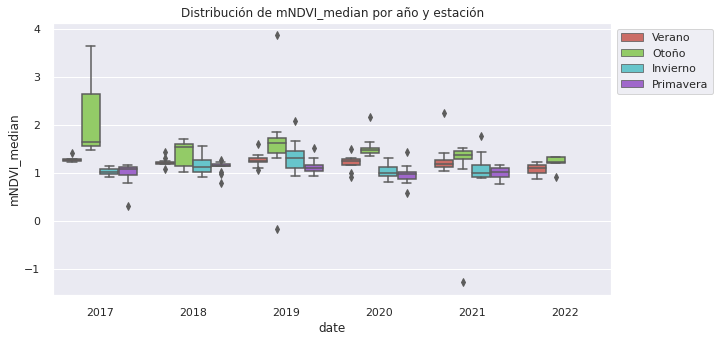

In [ ]:
sns.boxplot(data=df_sarmiento_copy, x=df_sarmiento_copy['date'].dt.year, hue='estacion', y='mNDVI_median',palette="hls")
plt.title('Distribución de mNDVI_median por año y estación')
plt.legend(bbox_to_anchor=(1, 1), loc='upper left') 
plt.show()

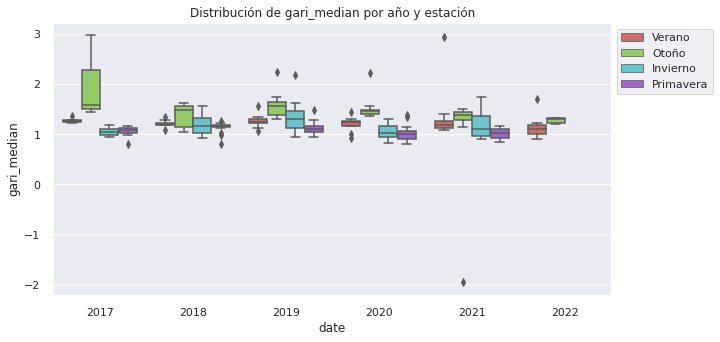

In [ ]:
sns.boxplot(data=df_sarmiento_copy, x=df_sarmiento_copy['date'].dt.year, hue='estacion', y='gari_median',palette="hls")
plt.title('Distribución de gari_median por año y estación')
plt.legend(bbox_to_anchor=(1, 1), loc='upper left') 
plt.show()

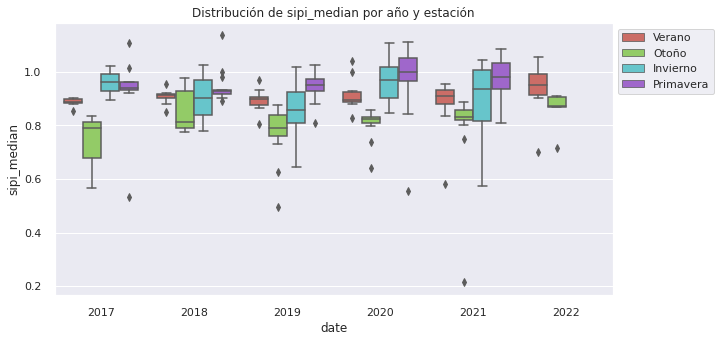

In [ ]:
sns.boxplot(data=df_sarmiento_copy, x=df_sarmiento_copy['date'].dt.year, hue='estacion', y='sipi_median',palette="hls")
plt.title('Distribución de sipi_median por año y estación')
plt.legend(bbox_to_anchor=(1, 1), loc='upper left') 
plt.show()

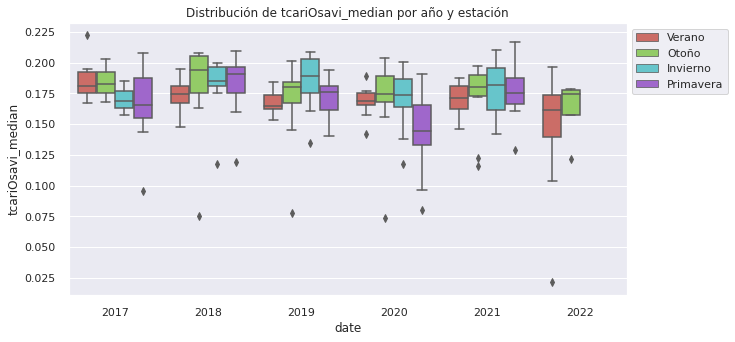

In [ ]:
sns.boxplot(data=df_sarmiento_copy, x=df_sarmiento_copy['date'].dt.year, hue='estacion', y='tcariOsavi_median',palette="hls")
plt.title('Distribución de tcariOsavi_median por año y estación')
plt.legend(bbox_to_anchor=(1, 1), loc='upper left') 
plt.show()

**Boxplot por año y estación para cada variable correspondiente a las bandas**

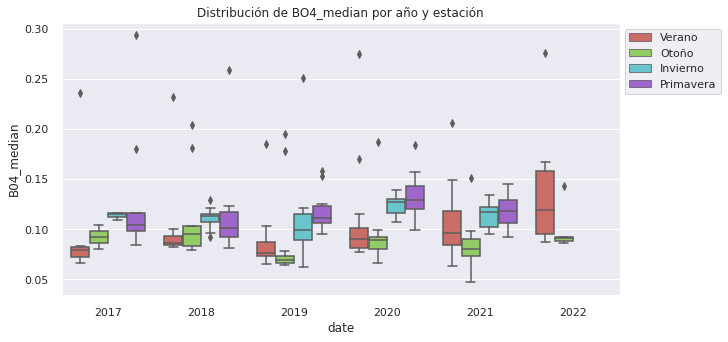

In [ ]:
sns.boxplot(data=df_sarmiento_copy, x=df_sarmiento_copy['date'].dt.year, hue='estacion', y='B04_median',palette="hls")
plt.title('Distribución de BO4_median por año y estación')
plt.legend(bbox_to_anchor=(1, 1), loc='upper left') 
plt.show()

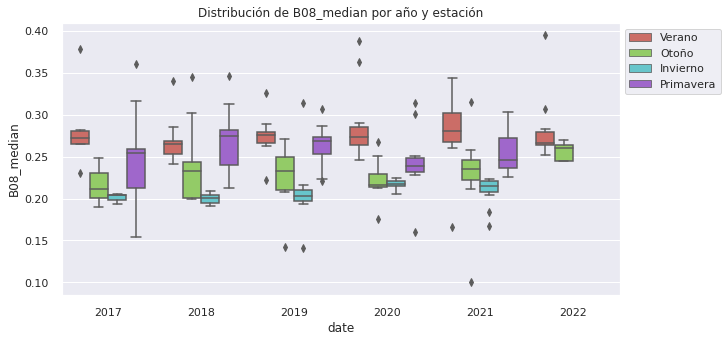

In [ ]:
sns.boxplot(data=df_sarmiento_copy, x=df_sarmiento_copy['date'].dt.year, hue='estacion', y='B08_median',palette="hls")
plt.title('Distribución de B08_median por año y estación')
plt.legend(bbox_to_anchor=(1, 1), loc='upper left') 
plt.show()

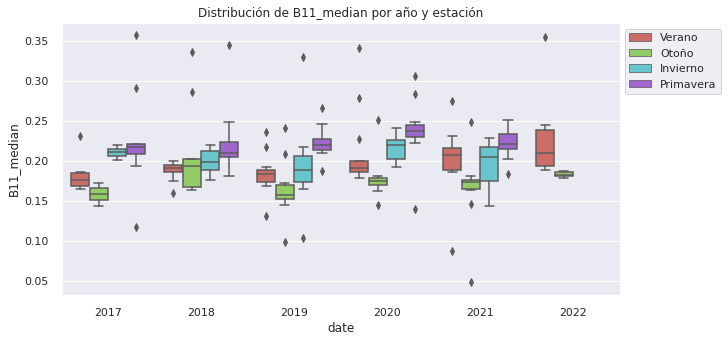

In [ ]:
sns.boxplot(data=df_sarmiento_copy, x=df_sarmiento_copy['date'].dt.year, hue='estacion', y='B11_median',palette="hls")
plt.title('Distribución de B11_median por año y estación')
plt.legend(bbox_to_anchor=(1, 1), loc='upper left') 
plt.show()

Como se puede apreciar en los boxplots para cada variable se observa un comportamiento estacional, es decir, para cada año en estudio los valores correspondientes a la mediana de los índices y bandas seleccionados tienen un comportamiento cíclico que, al estar dichos valores discriminados por estación,  es más sencillo visualizar sus subidas y bajadas. Esto es, se puede identidicar claramente un máximo y un mínimo de valor por cada año según la estación y a su vez se observa que, más allá de la variabilidad representada por las cajas de los gráficos, estas cantidades no presentan cambios abruptos a lo largo del periodo que estamos analizando.

Para una descripción más detallada, seleccionamos las variables ndii_median y B08_median y observamos el comportamiento detallado anteriormente: ambas presentan, la mayoría de las veces, valores máximos durante el verano y valores mínimos durante el invierno repitiendosé para cada año en cuestión. En el gráfico de línea se puede apreciar el mismo comportamiento pero con menos detalle, como por ejemplo decidir en que momento (estación) se produce un valor o comportamiento atípico.

Notar que para el periodo correspondiente al año 2021 hay una diferencia en el comportamiento de los valores de ndvi_median durante el verano y otoño respecto a los años anteriores y que los valores para B08_median asociados en el cálculo de este índice, también presentan mayores variaciones en el 2021 en comparación a los años precedentes, mostrando una clara relación estre ambas variables.








El siguiente gráfico muestra a la izquierda la distribución de las variables **ndii_median** y **B08_median** condicionadas al tiempo (lineplot) y, a la derecha, su distribución por año y estación (boxplot).

No handles with labels found to put in legend.
No handles with labels found to put in legend.


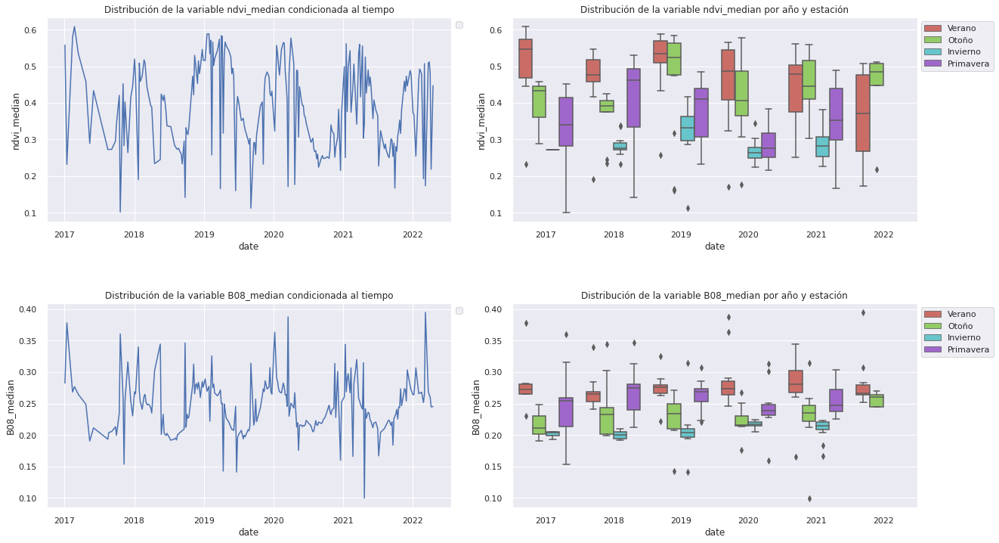

In [ ]:
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(20,10)) #ancho=10, alto=30

for index, col in enumerate(['ndvi_median', 'B08_median']):
  axes[index][0].set_title(f"Distribución de la variable {col} condicionada al tiempo")
  sns.lineplot(data=df_sarmiento_copy, x=df_sarmiento_copy['date'], y=col , ax=axes[index][0])
  axes[index][0].legend(bbox_to_anchor=(1, 1), loc='upper left') 
  
  axes[index][1].set_title(f"Distribución de la variable {col} por año y estación")
  sns.boxplot(data=df_sarmiento_copy, x=df_sarmiento_copy['date'].dt.year, hue='estacion', y=col, palette="hls", ax=axes[index][1])
  axes[index][1].legend(bbox_to_anchor=(1, 1), loc='upper left') 


plt.subplots_adjust(left=0.1,
                    bottom=0.1, 
                    right=0.9, 
                    top=1, 
                    wspace=0.15, 
                    hspace=0.4)
plt.show()

También podemos estudiar la estacionalidad anual de cada variable, por ejemplo si elegimos las variables **ndvi_median**, **gari_median** y **B11_median** obtenemos los siguientes boxplots.

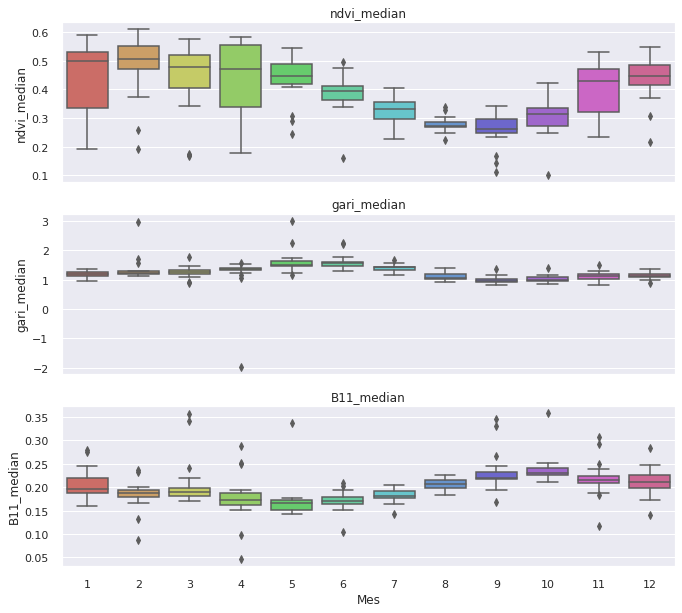

In [ ]:
df_sarmiento_copy['Mes'] = df_sarmiento_copy['date'].dt.month
fig, ejes = plt.subplots(3, 1, figsize=(11, 10), sharex=True)
for nombre, eje in zip(['ndvi_median','gari_median','B11_median'], ejes):
    sns.boxplot(data=df_sarmiento_copy,x='Mes',y=nombre,ax=eje, palette="hls")
    eje.set_title(nombre)
   
    if eje != ejes[-1]:
        eje.set_xlabel('')

  



En estos gráficos boxplots observamos un patrón de repetición cíclico y
los diagramas de cajas mensuales son diferentes entre sí. Esto indica un comportamiento estacional de las variables en estudio. 

Claramente las estacionalidades no son todas iguales, por ejemplo, en el gráfico de ndvi_mean observamos que durante los 4 primeros meses del año los valores van en aumento ,los 4 posteriores van en baja y luego vuelven a crecer en los 4 últimos meses del año. Sin embargo, cuando observamos las cajas de gari_mean vemos que el comportamiento es inverso al que describimos para ndvi_mean.


* Seleccione un índice y grafique un boxplot para cada año. ¿Se mantiene inalterada en el tiempo la distribución? Que pasa si ese boxplot lo separa por estación (invierno,verano,otoño, primavera) y año son parecidas entre ellas en algun caso? Como se comportan año a año?

In [ ]:
!pip install joypy
from joypy import joyplot
from matplotlib import cm



Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
df_sarmiento_copy['Año'] = df_sarmiento_copy['date'].dt.year

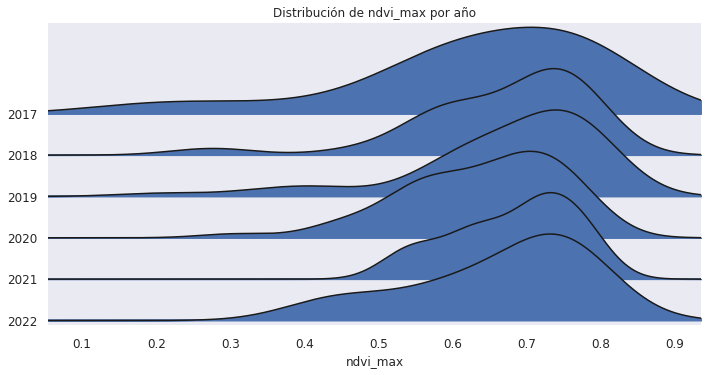

In [ ]:

joyplot(df_sarmiento_copy, by = 'Año', column = ['ndvi_max','estacion'], ylim='own')
plt.xlabel("ndvi_max")
plt.title('Distribución de ndvi_max por año')

plt.show()


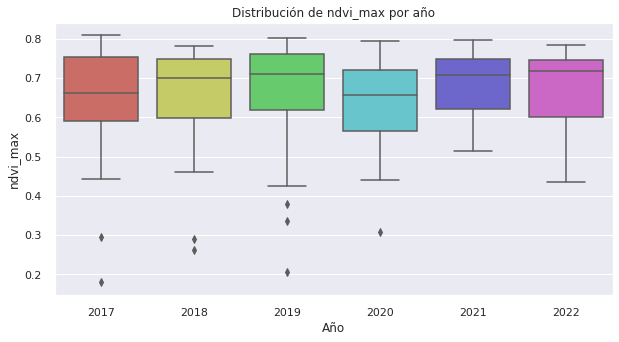

In [ ]:
 sns.boxplot(data=df_sarmiento_copy, x='Año',y='ndvi_max' ,palette="hls")
 plt.title('Distribución de ndvi_max por año')
 plt.show()

El boxplot correspondiente a valores de ndvi_max por año, acompañado del joyplot, nos muestra que las características generales de las distribuciones se mantienen inalteradas, es decir, podemos ver que en los 6 boxplot  representan distribuciones insesgadas hacia la izquierda tal como se observa en las gráficas de densidad. 

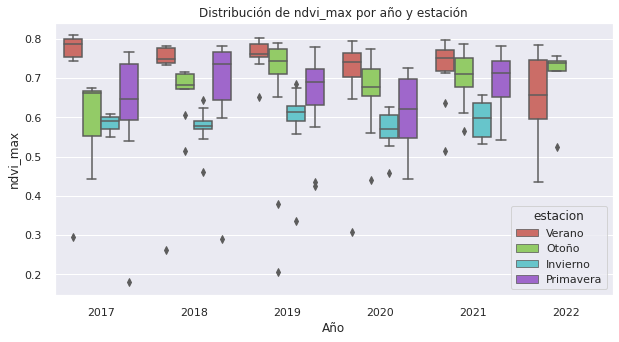

In [ ]:
sns.boxplot(data=df_sarmiento_copy, x='Año', hue='estacion', y='ndvi_max', palette="hls")
plt.title('Distribución de ndvi_max por año y estación')
plt.show()

Si separamos las distribuciones por año y estación, podemos ver que las distribuciones son distintas entre estaciones de un mismo año y entre ellos. Por ejemplo, a grandes rasgos, el ndvi_max parece mantener el comportamiento de la distribución en época de verano y primavera pero en otoño e invierno  este comportamiento no está bien definido, posiblemente por la presencia de outliers o datos faltantes. Esto se puede ver mejor en los boxplot y joyplot  de ndvi_max correspondientes a verano e invierno, por año.

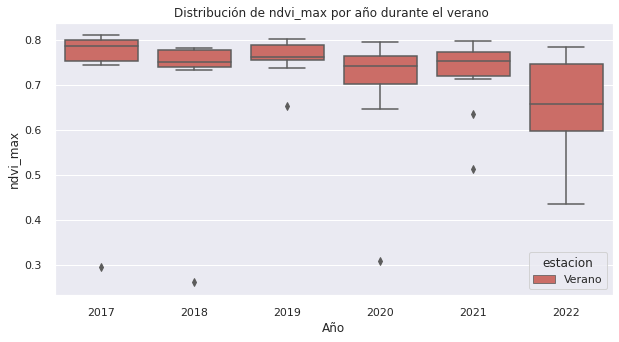

In [ ]:
df_v=df_sarmiento_copy[df_sarmiento_copy.estacion == 'Verano']
sns.boxplot(data=df_v, x='Año', hue='estacion', y='ndvi_max', palette="hls")
plt.title('Distribución de ndvi_max por año durante la temporada de verano ')
plt.show()

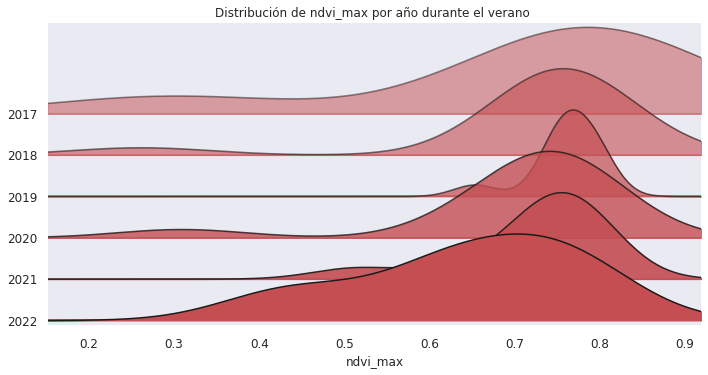

In [ ]:

joyplot(df_v, by = 'Año', column = 'ndvi_max', ylim='own', color='r', fade = True, figsize = (10,5), alpha=0.2)
plt.xlabel("ndvi_max")
plt.title('Distribución de ndvi_max por año durante la temporada de verano ')
plt.show()

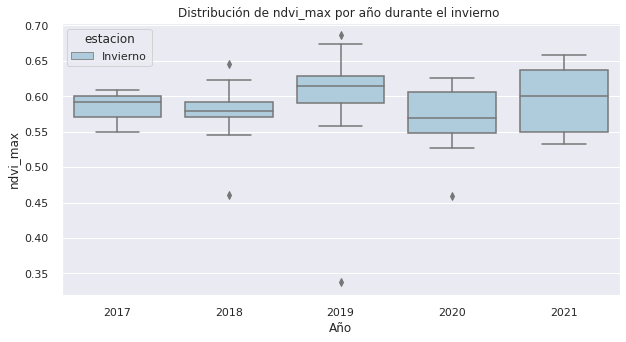

In [ ]:
df_i=df_sarmiento_copy[df_sarmiento_copy.estacion == 'Invierno']
sns.boxplot(data=df_i, x='Año', hue='estacion', y='ndvi_max', palette="Paired")
plt.title('Distribución de ndvi_max por año durante la temporada de invierno ')
plt.show()

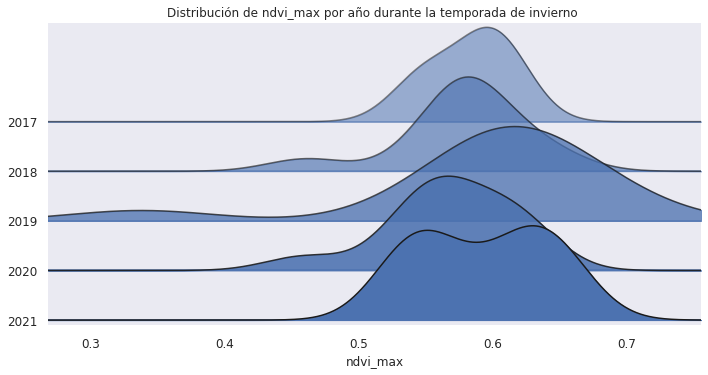

In [ ]:

joyplot(df_i, by = 'Año', column = ['ndvi_max','estacion'], ylim='own', color='b',fade = True, figsize = (10,5), alpha=0.4)
plt.xlabel("ndvi_max")
plt.title('Distribución de ndvi_max por año durante la temporada de invierno ')
plt.show()

Notar que en el año $2021$, para la temporada de invierno, la distribución es muy distinta al resto de los años en estudio. Sería factible de estudiar allí presencia de datos faltantes y outliers con más detenimiento.

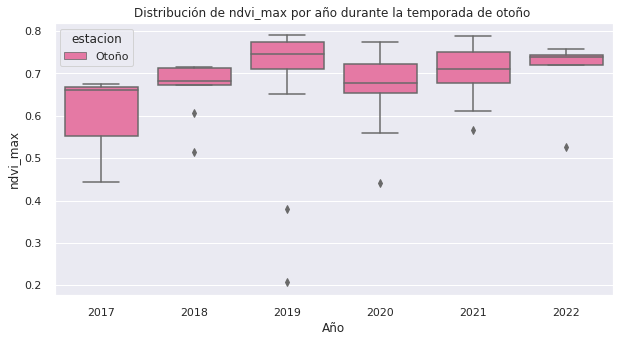

In [ ]:
df_o=df_sarmiento_copy[df_sarmiento_copy.estacion == 'Otoño']
sns.boxplot(data=df_o, x='Año', hue='estacion', y='ndvi_max', palette="RdPu")
plt.title('Distribución de ndvi_max por año durante la temporada de otoño ')
plt.show()

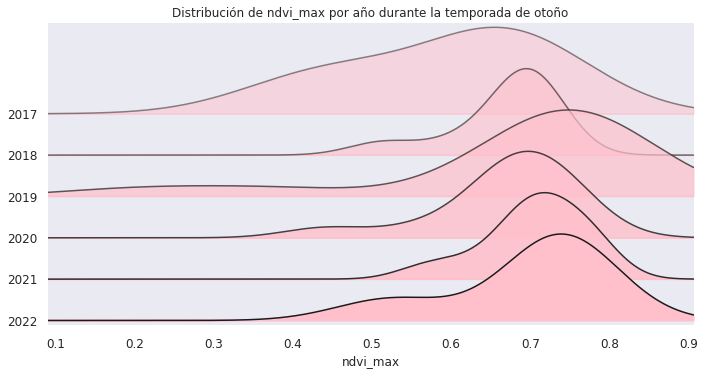

In [ ]:
joyplot(df_o, by = 'Año', column = ['ndvi_max','estacion'], ylim='own', color='pink',fade = True, figsize = (10,5), alpha=0.4)
plt.xlabel("ndvi_max")
plt.title('Distribución de ndvi_max por año durante la temporada de otoño')
plt.show()

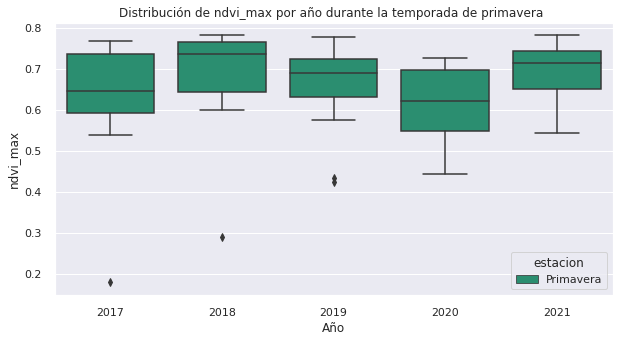

In [ ]:
df_p=df_sarmiento_copy[df_sarmiento_copy.estacion == 'Primavera']
sns.boxplot(data=df_p, x='Año', hue='estacion', y='ndvi_max', palette="Dark2")
plt.title('Distribución de ndvi_max por año durante la temporada de primavera ')
plt.show()

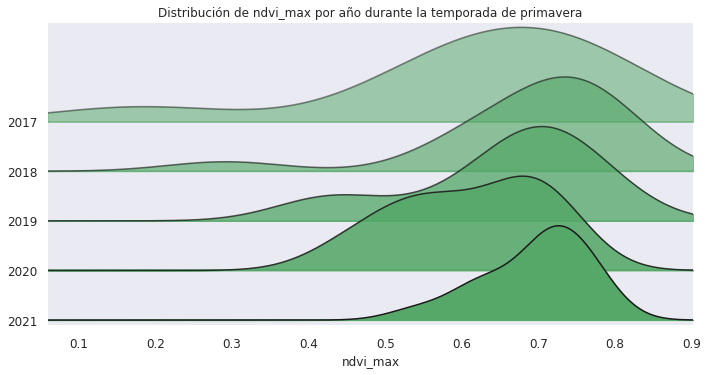

In [ ]:
joyplot(df_p, by = 'Año', column = ['ndvi_max','estacion'], ylim='own', color='g',fade = True, figsize = (10,5), alpha=0.4)
plt.xlabel("ndvi_max")
plt.title('Distribución de ndvi_max por año durante la temporada de primavera')
plt.show()

- Tiene sentido calcular outliers para todo el tiempo de la serie o deberia segmentarse? Es decir, un outlier en otoño es lo mismo que en primavera o verano?

Otro aspecto a estudiar en el análisis preliminar de una serie temporal es el de
los comportamientos extraños. Ante un outlier en primer lugar debemos estudiar si se trata de un error en la recogida de los datos, o de causas externas que han afectado a la variable. 

Si una serie temporal tiene valores perdidos (en un determinado momento no
se han recogido datos) o valores raros, no podemos ignorarlos. Tal como se observó en los gráficos del inciso anterior, segmentar los datos en periodos de tiempo más pequeños ayuda a una mejor comprensión de esos valores atípicos y a realizarnos preguntas relacionadas a la consistencia de los datos o a problemas en su recolección.

Los valores atípicos pueden reflejar efectos ocasionales asociados a condiciones meteorológicas transitorias, pero también pueden ser producto de alguna tendencia en el comportamiento de los valores de la variable o debido a subidas/bajadas bruscas de nivel (media).

Por todo lo anterior, no podemos considerar analizar bajo una misma perspectiva un outlier en un índice a lo largo de toda la serie temporal pues, un valor atípico que no ha sido identificado en una temporada en particular viene a representar un comportamiento extraño que quizá es significativo para cierta estación del año pero para otra no lo es.

In [ ]:
import missingno as msno
test=TEST_COLS_I_B+['estacion','date']

In [ ]:
msno.bar(df_sarmiento[test] ,figsize=(12, 6), fontsize=12, color='steelblue')

In [ ]:
df=df_sarmiento[['B02_median', 'date', 'estacion']][df_sarmiento['B02_median'].isnull()]


In [ ]:
sns.barplot(data=df_sarmiento, x=df_sarmiento['date'].dt.year, hue='estacion', y='gari_median',palette="hls")

In [ ]:
sns.lineplot(data=df, x=df['date'], hue='estacion', y='B02_median',palette="hls")

In [ ]:
df.isnull().sum()

In [ ]:
msno.matrix(df_CORR.sample(200),figsize=(12, 6), fontsize=12, color=[0,0,0.2])